# Figure 1

In [2]:
import string
import time
import argparse as ap
import sys
import os
import obspy
import obspy.core as oc
from obspy.geodetics import kilometers2degrees
from obspy.geodetics import degrees2kilometers
from obspy.geodetics import FlinnEngdahl
from obspy.geodetics import gps2dist_azimuth
from obspy import read
from obspy import UTCDateTime
from obspy.core.event import  Event, Origin, Magnitude, Pick, WaveformStreamID
from obspy import read_events
from obspy import Catalog

import pandas as pd
from pandas import read_csv
import matplotlib as mpl
import pylab as plt
import numpy as np
import linecache

from obspy import read_inventory
from obspy.clients.filesystem.sds import Client

import glob




In [3]:
def catalog2dataframe(inputcatalog,catalogname,C_lat,C_lon):

############################################################################################
## Convert a seismic catalog to pandas dataframe and make event selection to make figures ##
## Err_long = max error on longitude (km)                                                 ##
## Err_lat = max error on latitude (km)                                                   ##
## Err_depth = max error on depth (km)                                                    ##
## Err_gaps = max error on azimithal gap (deg)                                            ##
## Err_RMS = max error on RMS                                                             ##
## Max_dist = max distance from center (km)                                               ##
## C_lon = Center longitude                                                               ##
## C_lat = Center latitude                                                                ##
############################################################################################

    name = ['ML_picking' for event in inputcatalog]
    cat = [catalogname for event in inputcatalog]
    times = [event.origins[0].time.datetime for event in inputcatalog]
    lats = [event.origins[0].latitude for event in inputcatalog]
    lons = [event.origins[0].longitude for event in inputcatalog]
    deps = [event.origins[0].depth/1000.0 for event in inputcatalog]
    magnitudes = [event.magnitudes[0].mag for event in inputcatalog]
    magnitudestype = [event.magnitudes[0].magnitude_type for event in inputcatalog]
    rms = [event.origins[0].quality.standard_error for event in inputcatalog]
    lats_err = [event.origins[0].latitude_errors['uncertainty'] for event in inputcatalog]
    lons_err = [event.origins[0].longitude_errors['uncertainty'] for event in inputcatalog]
    deps_err = [event.origins[0].depth_errors['uncertainty'] for event in inputcatalog]
    gaps =[event.origins[0].quality.azimuthal_gap for event in inputcatalog]
    Dist = [gps2dist_azimuth(event.origins[0].latitude, event.origins[0].longitude,C_lat,C_lon)[0]/1000 for event in inputcatalog]


    pd_catalog = pd.DataFrame()
    pd_catalog['Name']=pd.Series(name).values
    pd_catalog['Catalog']=pd.Series(cat).values
    pd_catalog['Date']=pd.Series(times).values
    pd_catalog['Lons']=pd.Series(lons).values
    pd_catalog['Lats']=pd.Series(lats).values
    pd_catalog['Dep']=pd.Series(deps).values
    pd_catalog['Mags']=pd.Series(magnitudes).values
    pd_catalog['RMS']=pd.Series(rms).values
    pd_catalog['Gaps']=pd.Series(gaps).values
    pd_catalog['Errlo']=pd.Series(lons_err).values
    pd_catalog['Errla']=pd.Series(lats_err).values
    pd_catalog['Errde']=pd.Series(deps_err).values
    pd_catalog['Dist']=pd.Series(Dist).values

#     pd_catalog = pd_catalog.loc[(pd_catalog['Dist'] <= Max_dist)]
#     pd_catalog = pd_catalog.loc[(pd_catalog['RMS'] <= Err_RMS)]
#     pd_catalog = pd_catalog.loc[(pd_catalog['Dep'] >= 0)]

#     pd_catalog = pd_catalog.loc[(pd_catalog['Errlo'] <= Err_long/111)]
#     pd_catalog = pd_catalog.loc[(pd_catalog['Errla'] <= Err_lat/111)]
#     pd_catalog = pd_catalog.loc[(pd_catalog['Errde'] <= Err_depth*1000)]
#     pd_catalog = pd_catalog.loc[(pd_catalog['Gaps'] <= Err_gaps)]

    pd_catalog.index = pd.to_datetime(pd_catalog['Date'])

    pd_catalog.sort_index(inplace=True)

    cnt = [x+1 for x in range(len(pd_catalog))]
    cnts = pd.Series(cnt)
    pd_catalog['Count']=cnts.values

    return pd_catalog
#     pd_catalog.describe()

## Read station inventory

In [4]:
INVE='/home/jovyan/shared/users/spina/Norcia/INVENTORY/*.xml'

ii  = glob.glob(INVE)
inventory=obspy.Inventory()

for e in ii:
    inventory+=read_inventory(e)


### Station and Network list for figure legend

In [5]:
# Leggi il file 'station.txt' e memorizza i nomi delle stazioni in una lista
station_names = []

with open('stations_used.txt', 'r') as file:
    # Legge ogni linea del file e rimuove eventuali spazi bianchi o caratteri di nuova linea
    station_names = [line.strip() for line in file.readlines()]

# Visualizza la lista delle stazioni
print(station_names)


['AM05', 'AQU', 'ARRO', 'ARVD', 'ASSB', 'ATBU', 'ATCC', 'ATFO', 'ATLO', 'ATMI', 'ATSC', 'ATTE', 'ATVA', 'ATVO', 'CADA', 'CAMP', 'CESI', 'CESX', 'CIMA', 'CING', 'CSP1', 'EL6', 'FAGN', 'FDMO', 'FEMA', 'FIAM', 'FIU1', 'FOSV', 'FRON', 'GAG1', 'GIGS', 'GUMA', 'LNSS', 'MC2', 'MDAR', 'MGAB', 'MMO1', 'MMUR', 'MNTP', 'MOMA', 'MTL1', 'MURB', 'NRCA', 'OFFI', 'PIO1', 'PP3', 'RM33', 'SEF1', 'SMA1', 'SNTG', 'SRES', 'SSFR', 'SSM1', 'T1201', 'T1202', 'T1204', 'T1211', 'T1212', 'T1213', 'T1214', 'T1215', 'T1216', 'T1217', 'T1218', 'T1219', 'T1220', 'T1221', 'T1241', 'T1243', 'T1244', 'T1245', 'T1246', 'T1247', 'T1256', 'T1299', 'TERO', 'TRE1', 'TRTR', 'VCEL']


In [6]:
len(station_names)

79

In [8]:
stalist=set()
netset=set()
# for net in inventory.select(channel="*Z"):
for net in inventory.select(channel="*Z"):
    for sta in net:
        if sta.code in station_names:
            stalist.add(sta.code)
            netset.add(net.code)

In [9]:
netlist=[]
for i,sta in enumerate(stalist):
    netlist.append(inventory.select(station=sta)[0].code)

In [10]:
legenda = ['T1201','ATVA', 'AQU', 'AM05']

### Create list for legend only

In [11]:
staleg_lon=[]
staleg_lat=[]
for sta in legenda:
    idseed = inventory.select(station=sta).get_contents()['channels'][0]
    staleg_lat.append(inventory.get_coordinates(idseed)['latitude'])
    staleg_lon.append(inventory.get_coordinates(idseed)['longitude'])


/home/jovyan/envs/gmt/lib/python3.11/site-packages/obspy/core/inventory/inventory.py:482: UserWarning: Found more than one matching channel metadata. Returning first.
  warnings.warn(msg)


### Create list to plot stations

In [12]:
sta_lon=[]
sta_lat=[]
for sta in station_names:
    idseed = inventory.select(station=sta).get_contents()['channels'][0]
    sta_lat.append(inventory.get_coordinates(idseed)['latitude'])
    sta_lon.append(inventory.get_coordinates(idseed)['longitude'])


## Read Tomo-grid data

In [13]:
df_tomo = pd.read_csv('nodesP.csv')


In [14]:
# Aggiungi una colonna 'latitude' per la latitudine decimale
df_tomo['latitude'] = df_tomo['latd'] + df_tomo['latm'] / 60

# Aggiungi una colonna 'longitude' per la longitudine decimale
df_tomo['longitude'] = df_tomo['lond'] + df_tomo['lonm'] / 60

# Visualizza il dataframe per verificare
# print(df_tomo[['latd', 'latm', 'latitude', 'lond', 'lonm', 'longitude']])


## Read Faults data

In [15]:

# Supponiamo che il file si chiami 'data.txt'
# Il parametro sep='\t' indica che i campi sono separati da tabulazioni
df = pd.read_csv('Villani-etal_2017.xyz', sep='\t', skiprows=1, names=['Lat', 'Lon', 'Depth','fix'])

# Visualizza le prime righe del DataFrame per verificare il contenuto
print(df.head())


         Lat        Lon  Depth   fix
0  42.892671  13.169741 -0.963  0.05
1  42.892671  13.169741 -0.963  0.05
2  42.892671  13.169741 -0.963  0.05
3  42.892671  13.169741 -0.963  0.05
4  42.893348  13.169394 -1.004  0.05


### Download data from INGV bulletin and save to local file (if not already saved on local file INGV_BULLETIN.xml)

In [ ]:
from obspy.clients.fdsn import Client
ingv=Client("INGV")

# starttime=obspy.UTCDateTime("2016-08-15T00:00:00")
# # endtime=obspy.UTCDateTime("2017-09-01T00:00:00")
# endtime=starttime+86400

cat_full=obspy.Catalog()
for i in range(0,385):
    starttime=obspy.UTCDateTime("2016-08-15T00:00:00")+i*86400
    endtime=starttime+86400
    cat_download=ingv.get_events(starttime=starttime,endtime=endtime,minlat=42.0,maxlat=44.,minlon=12,maxlon=14)
    cat_full.extend(cat_download)



cat_full.write("INGV_BULLETIN.xml",format='QUAKEML')

### Read INGV_Bulletin catalog

In [26]:
cat_full=read_events('./INGV_BULLETIN.xml')

catname = 'ingv_bulletin' 
center = (42.825 , 13.1)
ingv_full = catalog2dataframe(cat_full,catname,center[0],center[1])
ingv_full['Date'] = ingv_full['Date'].apply(lambda x: UTCDateTime(x))
ingv_full=ingv_full.loc[(ingv_full['Date'] < UTCDateTime(2017,9,1))]


# Select subset for panel (b)
ingv_orig = ingv_full.loc[(ingv_full['Date'] >= UTCDateTime(2016,10,20)) & (ingv_full['Date'] < UTCDateTime(2016,12,1)) & 
                     (ingv_full['Lons'] >= 12.9) & (ingv_full['Lons'] <= 13.3) &
                     (ingv_full['Lats'] >= 42.7) & (ingv_full['Lats'] <= 42.95)]

## Plot Central Apennines (panel a)

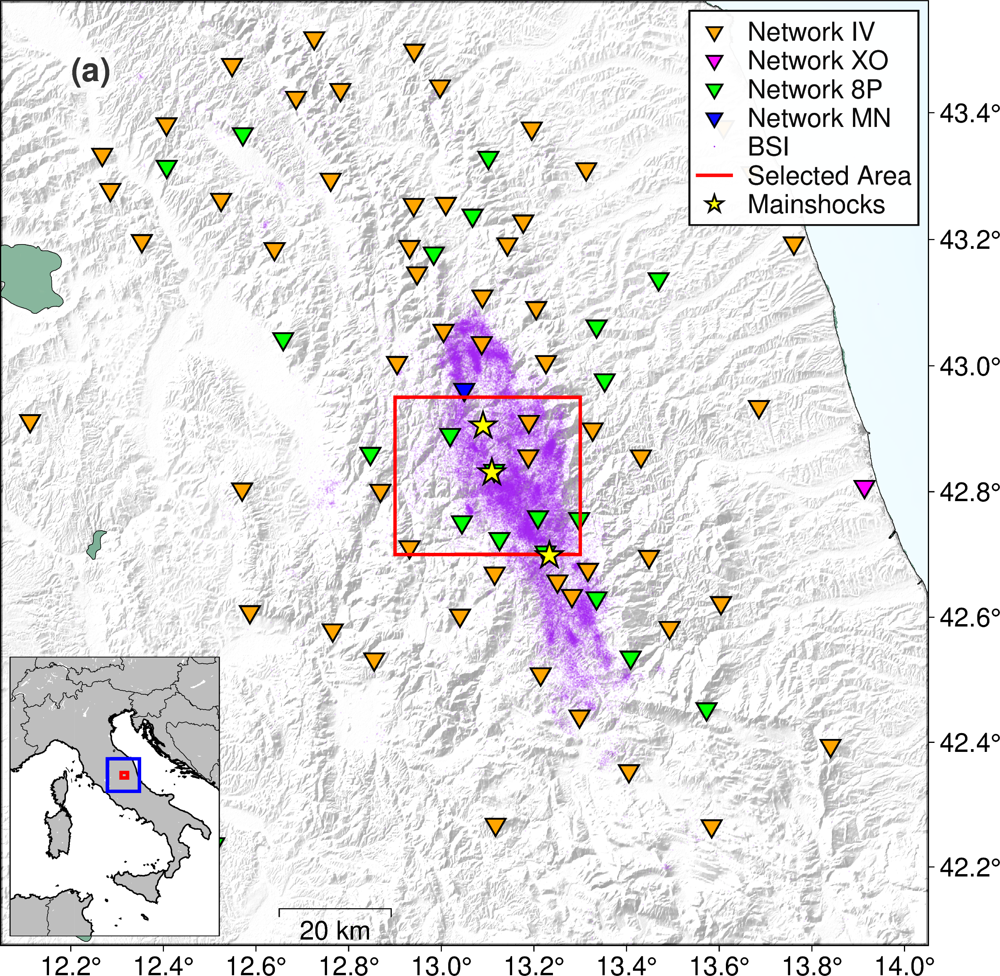

In [37]:
import pygmt
import numpy as np

# Define font size
font = "12p,Helvetica-Bold"
font2 = "20p,Helvetica-Bold"

# Define the center coordinates
center = (13.05, 42.825)

# Define a region around the center (change +/- degrees as needed for zoom level)
lat_range = 0.75  # Latitude range to add/subtract from the center
lon_range = 1  # Longitude range to add/subtract from the center

# Calculate the region around the center
region = [
    center[0] - lon_range,  # Western longitude
    center[0] + lon_range,  # Eastern longitude
    center[1] - lat_range,  # Southern latitude
    center[1] + lat_range   # Northern latitude
]

# Load sample grid (3 arc-seconds global relief) in the new region
grid = pygmt.datasets.load_earth_relief(resolution="03s", region=region)

# Create land and wet areas based on grdlandmask
land = grid * pygmt.grdlandmask(region=region, 
     spacing="03s", 
     maskvalues=[0, 1], 
     resolution="f")
wet = grid * pygmt.grdlandmask(region=region, 
     spacing="03s", 
     maskvalues=[1, "NaN"], 
     resolution="f")

# Create the figure
fig = pygmt.Figure()
pygmt.config(FORMAT_GEO_MAP="ddd.x", MAP_FRAME_TYPE="plain",FONT_ANNOT_PRIMARY="16p", FONT_ANNOT_SECONDARY="16p", FONT_LABEL="16p")

with pygmt.config(MAP_FRAME_TYPE="plain"):
    fig.basemap(region=region, projection="M20c", frame=["lSEt", "xa0.2", "ya0.2"])

# Create the colormap and plot land and sea areas
pygmt.makecpt(cmap="gray", series=[-3, 3, 0.5], continuous=True)
fig.grdimage(grid=land, projection="M20c", cmap=True, shading=True, transparency=40)

pygmt.makecpt(cmap="terra", series=[-7000, 7000,100], continuous=True)
fig.grdimage(grid=wet, cmap=True, nan_transparent=True)

# Plot the coastlines and rivers
fig.coast(region=region, shorelines=True, resolution='f')
fig.coast(rivers="1/0.5p,blue")  # Rivers


# Define a color mapping for the network codes (customize as needed)
color_map = {
    'IV': 'orange',
    '8P': 'green',
    'MN': 'blue',
    'XO': 'magenta'
}

for i, net in enumerate(netset):
    fig.plot(
        x=[staleg_lon[i]], 
        y=[staleg_lat[i]], 
        style="i0.4c",  # Triangular marker
        fill=color_map[net],  # Color based on netlist
        pen="1p,black",  # Outline the triangle with a black pen
        label=f"Network {net}"  # Label each station (optional)
    )


# Plot INGV catalog
fig.plot(
    x=ingv_full['Lons'],  # Longitude values from the DataFrame
    y=ingv_full['Lats'],  # Latitude values from the DataFrame
    style="c0.03c",  # Style for the points (e.g., triangle markers)
    fill="purple",  # Color for the points
    # pen="1p,black",  # Outline for the points
    label="BSI", # Legend label
    transparency=85,
)

# Plot stations with triangles, colored based on the netlist code
for i, net in enumerate(netlist):
    fig.plot(
        x=[sta_lon[i]], 
        y=[sta_lat[i]], 
        style="i0.5c",  # Triangular marker
        fill=color_map[net],  # Color based on netlist
        pen="1p,black"  # Outline the triangle with a black pen
        # label=f"Network {net}"  # Label each station (optional)
    )

# Plot a rectangle with the given coordinates [12.85, 13.35, 42.675, 42.975]
fig.plot(
    x=[12.9, 13.3, 13.3, 12.9, 12.9],  # Longitudes of the rectangle
    y=[42.7, 42.7, 42.95, 42.95, 42.7],  # Latitudes of the rectangle
    pen="2p,red",  # Red line with 2 point thickness
    label="Selected Area"  # Label for the rectangle (optional)
)

# Plot Mainshocks from ingv catalog
main=ingv_full.loc[ingv_full['Mags']>= 5.6]
fig.plot(
    x=main['Lons'],  # Longitude values from the DataFrame
    y=main['Lats'],  # Latitude values from the DataFrame
    style="a0.6c",  # Style for the points (e.g., triangle markers)
    fill="yellow",  # Color for the points
    pen="1p,black",  # Outline for the points
    # label="Mainshocks"  # Legend label
)


# Add a red star to the legend to represent "Mainshocks"
fig.plot(
    x=[region[0] - 1],  # Position the star outside the map area (off the map)
    y=[region[1] - 1],  # Position the star outside the map area (off the map)
    style="a0.4c",  # Star marker with a size of 0.6 cm
    fill="yellow",  # Red color for the star
    pen="1p,black",  # Black outline for the star
    label="Mainshocks"  # Label for the legend
)

# Add map scale
fig.basemap(map_scale='jBL+o6./0.6+w20')

# Add a legend with transparency
fig.legend(transparency=5)

# Add text labels (assuming stalist, dx, and dy are defined)
# for i, sta in enumerate(stalist):
#     fig.text(text=sta, x=sta_lon[i], y=sta_lat[i], font=font, fill='white', transparency=20, offset="0c/0.4c", justify="BC")

fig.text(text="(a)", x=12.2,y=43.45,font=font2, justify="BL",fill='white', transparency=20)


with fig.inset(position="jBL+w4.5c/6c+o0.2c/0.2c", box="+gwhite+p1p"):
    fig.coast(
        region=[6, 19, 35, 48],
        projection="M6/?",
        land="gray",
        borders=[1, 2],
        shorelines="1/thin",
        water="white",
        # Use dcw to selectively highlight an area
        # dcw="US.MA+gred",
    )

    rectangle = [[region[0], region[2],region[1], region[3]]]
    rectangle2 = [[12.9, 42.7,13.3, 42.95]]
    fig.plot(data=rectangle, style="r+s", pen="2p,blue")
    fig.plot(data=rectangle2, style="r+s", pen="2p,red")

# Save the figure
fig.savefig("FIGURE/Large_map_with_colored_triangles.png",dpi=300)

# Display the figure
fig.show()


## Plot selected area (panel b)

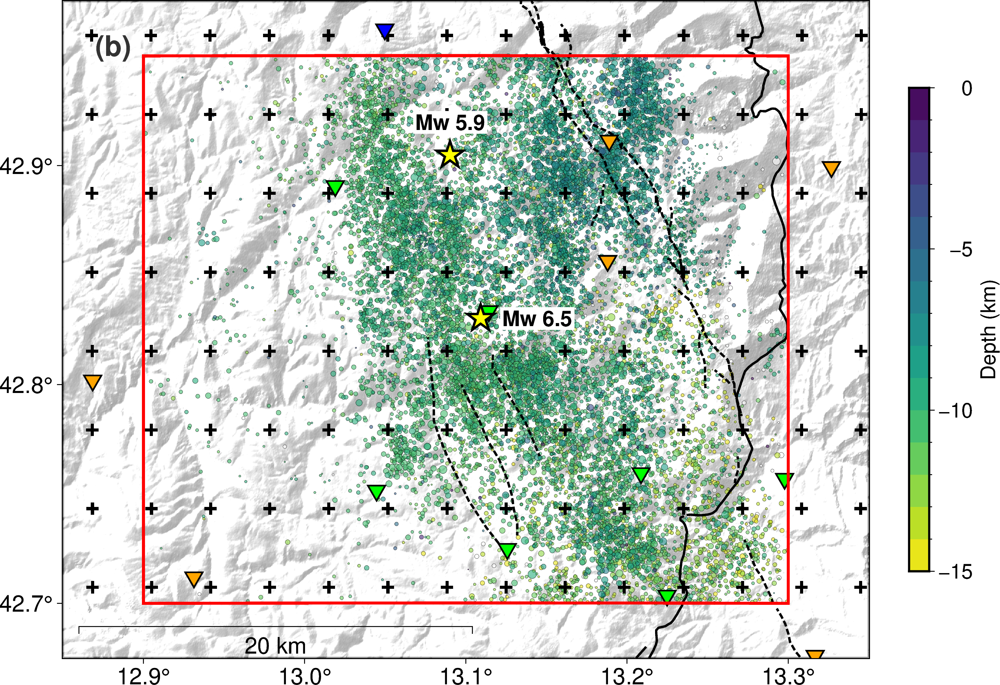

In [42]:
import pygmt
import pandas as pd
import matplotlib.ticker as mticker

# Supponiamo di avere già creato il DataFrame df con le colonne 'Lat', 'Lon', e 'Depth'

# Define the center coordinates
center = (13.1, 42.825)

# Define a smaller region around the center with a higher resolution
lat_range = 0.15  # Latitude range to add/subtract from the center
lon_range = 0.25  # Longitude range to add/subtract from the center

# Calculate the region around the center
region = [
    center[0] - lon_range,  # Western longitude
    center[0] + lon_range,  # Eastern longitude
    center[1] - lat_range,  # Southern latitude
    center[1] + lat_range   # Northern latitude
]

# Load a higher resolution grid (1 arc-second) for a detailed view
grid = pygmt.datasets.load_earth_relief(resolution="01s", region=region)

font = "15p,Helvetica-Bold"
font2 = "20p,Helvetica-Bold"

# Create land and wet areas based on grdlandmask
land = grid * pygmt.grdlandmask(region=region, 
     spacing="01s",  # Match grid resolution
     maskvalues=[0, 1], 
     resolution="f")

# Create the figure
fig = pygmt.Figure()
pygmt.config(FORMAT_GEO_MAP="ddd.x", MAP_FRAME_TYPE="plain",FONT_ANNOT_PRIMARY="16p", FONT_ANNOT_SECONDARY="16p", FONT_LABEL="16p")


with pygmt.config(MAP_FRAME_TYPE="plain"):
    fig.basemap(region=region, projection="M20c", frame=["rSWt", "xa0.1", "ya0.1"])

# Create a custom colormap for depth (adjust the range according to your data)
# pygmt.makecpt(cmap="rainbow", series=[min(ingv_orig_depth), max(ingv_orig_depth),1], continuous=True)
pygmt.makecpt(cmap="viridis", series=[0, 15, 1])

# Resample the grid for regular spacing
grid_resampled = pygmt.grdsample(grid=grid, spacing="01s", region=region)


# Plot the land with the grayscale colormap
fig.grdimage(grid=grid_resampled, projection="M20c", cmap=True, shading=True, transparency=40)

# Plot the coastlines with high resolution
fig.coast(region=region, shorelines=True, resolution='h')  # 'h' for high resolution shorelines
fig.coast(rivers="1/0.5p,blue")  # Rivers


# Plot INGV catalog data points colored by depth
ingv_orig = ingv_orig.copy()  # crea una copia indipendente
ingv_orig.sort_values(by="Dep", ascending=False, inplace=True)

# ingv_orig.sort_values(by="Dep", ascending=False, inplace=True)
ingv_orig_mag = ingv_orig['Mags'].to_list()
resize_orig=[i*0.05 for i in ingv_orig_mag]
fig.plot(
    x=ingv_orig['Lons'],
    y=ingv_orig['Lats'],
    style="c",
    size=resize_orig,
    fill=ingv_orig['Dep'],  # Color according to depth
    cmap=True,  # Use the colormap generated above
    pen="faint",
    # label="BSI",
    transparency=40  # Set transparency for symbols
)

# Plot the fault data from the Laura
fault_directory = "FAULT_LAURA/SUB"
# Scorri tutti i file nella directory 'FAULT'
for filename in os.listdir(fault_directory):
    if filename.endswith(".txt"):
        # Percorso completo del file
        file_path = os.path.join(fault_directory, filename)
        
        # Leggi i dati del file .txt (assumiamo che ci siano 2 colonne: lon e lat)
        data = pd.read_csv(file_path, header=None, sep='\s+')
        
        # Assicurati che i dati siano nelle colonne corrette (lon, lat)
        lon = data[0]
        lat = data[1]
        
        # Traccia i punti (lon, lat) come una linea continua
        fig.plot(x=lon, y=lat, pen="1.5p,black,4_2:2p")

fault_directory = "FAULT-PUCCI"
# Scorri tutti i file nella directory 'FAULT'
for filename in os.listdir(fault_directory):
    # if filename.endswith("*.txt"):
    if filename.startswith("OAS"):
        # Percorso completo del file
        file_path = os.path.join(fault_directory, filename)
        
        # Leggi i dati del file .txt (assumiamo che ci siano 2 colonne: lon e lat)
        data = pd.read_csv(file_path, header=None, sep='\s+')
        
        # Assicurati che i dati siano nelle colonne corrette (lon, lat)
        lon = data[0]
        lat = data[1]
        
        # Traccia i punti (lon, lat) come una linea continua
        fig.plot(x=lon, y=lat, pen="1.5p")
for filename in os.listdir(fault_directory):
    # if filename.endswith("*.txt"):
    if filename.startswith("VBF"):
        # Percorso completo del file
        file_path = os.path.join(fault_directory, filename)
        
        # Leggi i dati del file .txt (assumiamo che ci siano 2 colonne: lon e lat)
        data = pd.read_csv(file_path, header=None, sep='\s+')
        
        # Assicurati che i dati siano nelle colonne corrette (lon, lat)
        lon = data[0]
        lat = data[1]
        
        # Traccia i punti (lon, lat) come una linea continua
        fig.plot(x=lon, y=lat, pen="1.5p,black,4_2:2p")


# Add map scale
fig.basemap(map_scale='jBL+o0.4/0.6+w20')


# Add text labels (assuming stalist, dx, and dy are defined)
# for i, sta in enumerate(stalist):
#     fig.text(text=sta, x=sta_lon[i], y=sta_lat[i], font=font, fill='white', transparency=20, offset="0c/0.4c", justify="BC")

# Add label
fig.text(text="(b)", x=12.87, y=42.95, font=font2, justify="BL", fill='white', transparency=20)

# Plot Alberto's tomographic grid
fig.plot(
    x=df_tomo['longitude'],  # Longitude values from the DataFrame
    y=df_tomo['latitude'],  # Latitude values from the DataFrame
    style="+0.3c",  # Style for the points (e.g., triangle markers)
    fill="black",  # Color for the points
    pen="2p,black",  # Outline for the points
    label="Tomographic grid"  # Legend label
)

# Define a color mapping for the network codes (customize as needed)
color_map = {
    'IV': 'orange',
    '8P': 'green',
    'MN': 'blue',
    'XO': 'magenta'
}

for i, net in enumerate(netset):
    fig.plot(
        x=[staleg_lon[i]],
        y=[staleg_lat[i]],
        style="i0.3c",  # Triangular marker
        fill=color_map[net],  # Color based on netlist
        pen="1p,black",  # Outline the triangle with a black pen
        label=f"Network {net}"  # Label each station (optional)
    )

# Plot stations with triangles, colored based on the netlist code
for i, net in enumerate(netlist):
    fig.plot(
        x=[sta_lon[i]],
        y=[sta_lat[i]],
        style="i0.5c",  # Triangular marker
        fill=color_map[net],  # Color based on netlist
        pen="1p,black")  # Outline the triangle with a black pen


main=ingv_orig.loc[ingv_orig['Mags']>= 5.5].sort_values(by=['Mags'],ascending=False)

# Add the text next to the stars with magnitudes
fig.text(
    x=[main[0:1]['Lons'].item() + 0.035],  # Longitude of the largest earthquake
    y=[main[0:1]['Lats'].item()],  # Adjust the position slightly above the star
    text=f"Mw {main[0:1]['Mags'].item()}",  # Text label for the largest earthquake
    font=font, 
    fill="white"
)

fig.text(
    x=[main[1:2]['Lons'].item()],  # Longitude of the second largest earthquake
    y=[main[1:2]['Lats'].item() + 0.015],  # Adjust the position slightly above the star
    text=f"Mw {main[1:2]['Mags'].item()}",  # Text label for the second largest earthquake
    font=font, 
    fill="white"
)


fig.plot(
    x=main['Lons'],
    y=main['Lats'],
    style="a0.7c",        # ingrandisci la stella (prima era 0.8c)
    fill="yellow",        # giallo pieno
    pen="1.5p,black",       # contorno nero più spesso
    transparency=0        # nessuna trasparenza
)

    
# Add a red star to the legend to represent "Mainshocks"
fig.plot(
    x=[region[0] - 1],  # Position the star outside the map area (off the map)
    y=[region[1] - 1],  # Position the star outside the map area (off the map)
    style="a0.4c",  # Star marker with a size of 0.6 cm
    fill="yellow",  # Red color for the star
    pen="1p,black",  # Black outline for the star
    label="Mainshocks"  # Label for the legend
)
# Add a circle to the legend to represent "Events"
fig.plot(
    x=[region[0] - 1],  # Position the circe outside the map area (off the map)
    y=[region[1] - 1],  # Position the circe outside the map area (off the map)
    style="c0.2c",  # Cerchio con dimensione fissa
    fill="darkgreen",  # Red color for the star
    pen="faint",  # Black outline for the star
    label="BSI"  # Label for the legend
)

# Plot a rectangle with the given coordinates [12.85, 13.35, 42.675, 42.975]
fig.plot(
    x=[12.9, 13.3, 13.3, 12.9, 12.9],  # Longitudes of the rectangle
    y=[42.7, 42.7, 42.95, 42.95, 42.7],  # Latitudes of the rectangle
    pen="2p,red",  # Red line with 2 point thickness
    label="Selected Area"  # Label for the rectangle (optional)
)


# Add a legend with transparency
# fig.legend(transparency=10)

fig.colorbar(
    frame='a5f1+lDepth (km)',
    position="JMR+w12c/0.5c+o1.0c/0c",  # Position the colorbar on the right with some offset
    cmap=True,  # Use the colormap defined earlier
    scale=-1,  # Invert the colorbar to have red at the bottom and violet at the top
)


# Save the figure
fig.savefig("FIGURE/mappa_orig_depth.png",dpi=300)

# Display the figure
fig.show()
